# How to Generate a Spectral element DEComposition (SDEC) Plot
The SDEC Plot illustrates the contributions of different chemical elements in the formation of a simulation model's spectrum. It is a spectral diagnostic plot similar to those originally proposed by M. Kromer (see, for example, [Kromer et al. 2013](https://arxiv.org/abs/1311.0310), figure 4).

In [1]:
# We filter out warnings throughout this notebook
import warnings
warnings.filterwarnings('ignore')

# Due to the large size of the SDEC plots in SVG format, we request output as a
# high-resolution PNG
%config InlineBackend.figure_formats='png2x'

First, create and run a simulation for which you want to generate this plot:

In [2]:
from tardis import run_tardis
from tardis.io.atom_data import download_atom_data
from tardis.io.configuration.config_reader import Configuration

# We download the atomic data needed to run the simulation
download_atom_data('kurucz_cd23_chianti_H_He_latest')

config = Configuration.from_yaml("tardis_example.yml")
config.montecarlo.tracking.track_rpacket = True

sim = run_tardis(config, virtual_packet_logging=True)

Atomic Data kurucz_cd23_chianti_H_He_latest already exists in /home/runner/Downloads/tardis-data/kurucz_cd23_chianti_H_He_latest.h5. Will not download - override with force_download=True.


Auto-detected Sphinx build environment


Auto-detected Sphinx build environment


Iterations:          0/? [00:00<?, ?it/s]

Packets:             0/? [00:00<?, ?it/s]

Initializing tabulator and plotly panel extensions for widgets to work


Embedding the final state for Jupyter environments


<div class="alert alert-info">

Note

The virtual packet logging capability must be active in order to produce the SDEC Plot for virtual packets population. Thus, make sure to set `virtual_packet_logging: True` in your configuration file if you want to generate the SDEC Plot with virtual packets. It should be added under the `virtual` property of the `spectrum` property, as described in the [configuration schema](https://tardis-sn.github.io/tardis/io/configuration/components/spectrum.html).

</div>

Now, import the plotting interface for the SDEC plot, i.e. the `SDECPlotter` class.

In [3]:
from tardis.visualization import SDECPlotter

And create a plotter object to process the data of simulation object `sim` for generating the SDEC plots.

In [4]:
%pdb
plotter = SDECPlotter.from_simulation(sim)

Automatic pdb calling has been turned ON


## Static Plot (in matplotlib)
You can now call the `generate_plot_mpl()` method on your `plotter` object to get a highly informative, yet beautiful, SDEC plot produced in matplotlib.

### Virtual packets mode
By default, an SDEC plot is produced for the virtual packet population of the simulation.

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

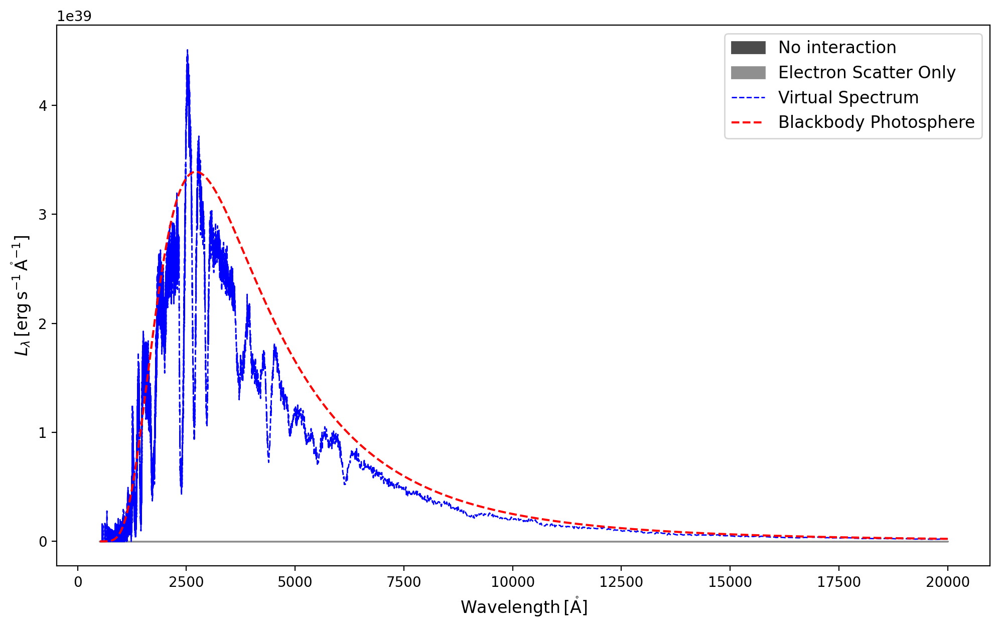

In [5]:
plotter.generate_plot_mpl()

### Real packets mode
You can produce the SDEC plot for the real packet population of the simulation by setting `packets_mode="real"` which is `"virtual"` by default. Since `packets_mode` is the 1st argument, you can simply pass `"real"` string only.

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

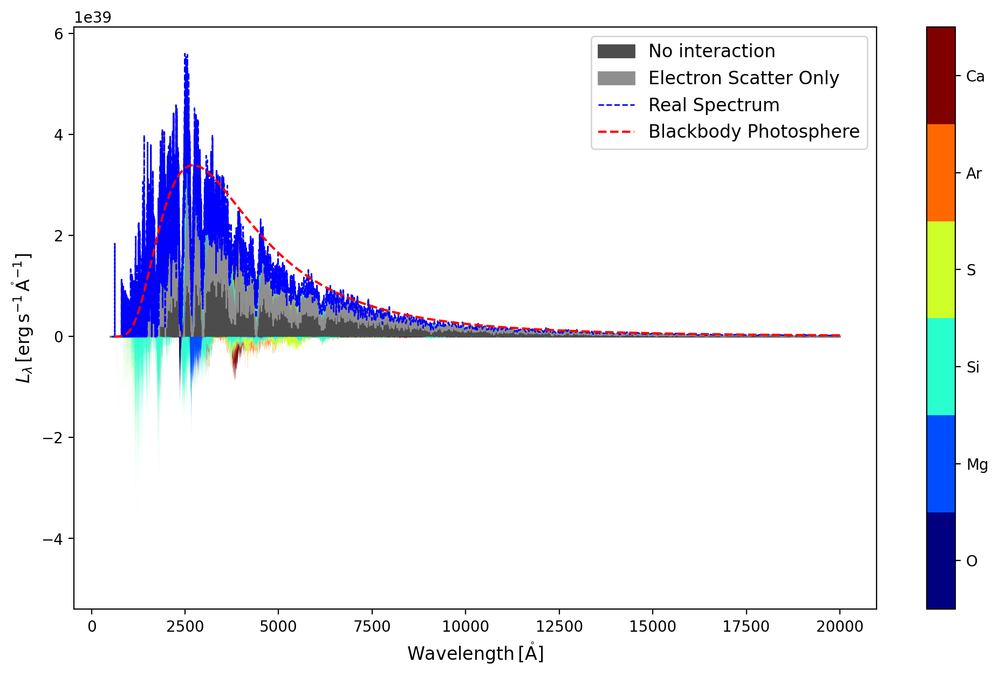

In [6]:
plotter.generate_plot_mpl("real")

### Plotting a specific wavelength range
You can also restrict the wavelength range of escaped packets that you want to plot by specifying `packet_wvl_range`. It should be a quantity in Angstroms, containing two values - lower lambda and upper lambda i.e. `[lower_lambda, upper_lambda] * u.AA`.

In [7]:
from astropy import units as u

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

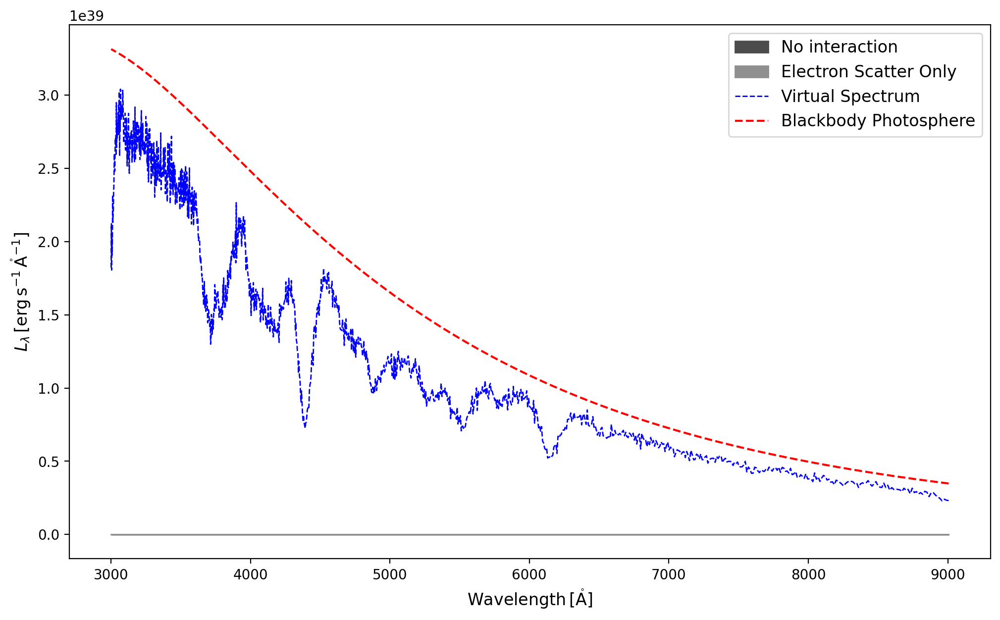

In [8]:
plotter.generate_plot_mpl(packet_wvl_range=[3000, 9000] * u.AA)

### Plotting only the top contributing elements

The `nelements` option allows you to plot the top contributing elements to the spectrum. The top elements are shown in unique colors and the rest of the elements are shown in silver. Please note this works only for elements and not for ions.

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

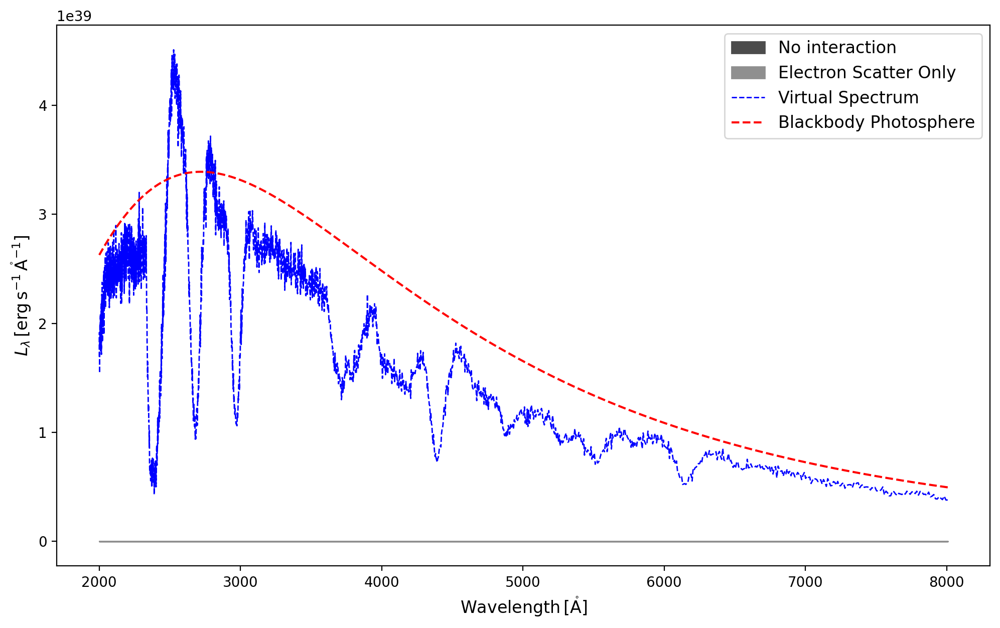

In [9]:
plotter.generate_plot_mpl(packet_wvl_range=[2000, 8000] * u.AA, nelements = 3)

### Choosing what elements/ions to plot

You can also pass a list of elements/ions of your choice in the `species_list` option and plot them. Valid options include elements (e.g. Si), ions (which must be specified in Roman numeral format, e.g. Si II), a range of ions (e.g. Si I-III), or any combination of these.

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

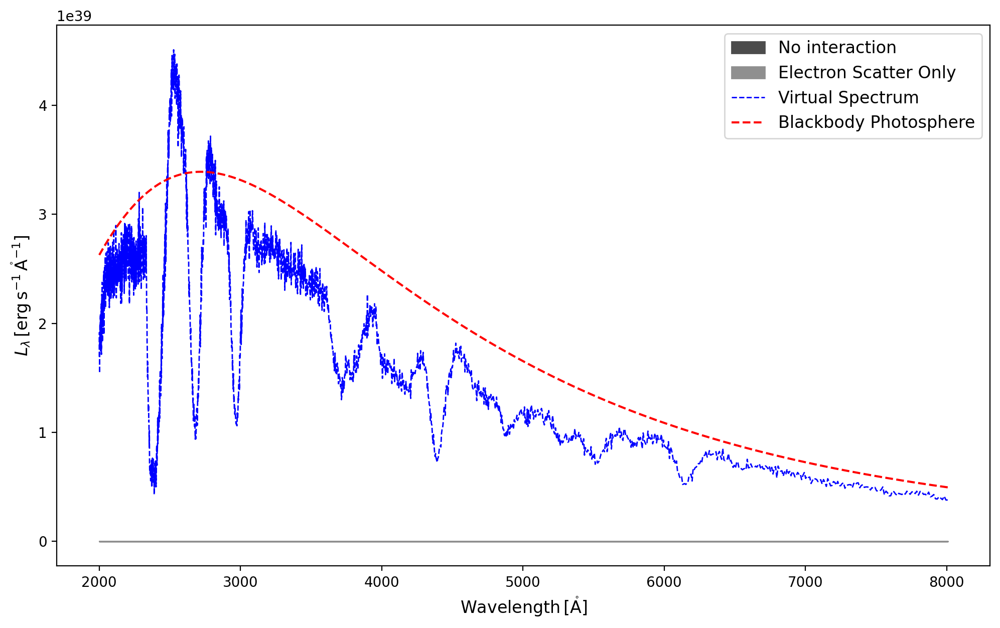

In [10]:
plotter.generate_plot_mpl(packet_wvl_range=[2000, 8000] * u.AA, species_list = ['Si II', 'S I-V', 'Ca'])

When using both the `nelements` and the `species_list` options, `species_list` takes precedence. 

[tardis.visualization.tools.sdec_plot][INFO   ]  Both nelements and species_list were requested. Species_list takes priority; nelements is ignored (sdec_plot.py:799)


<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

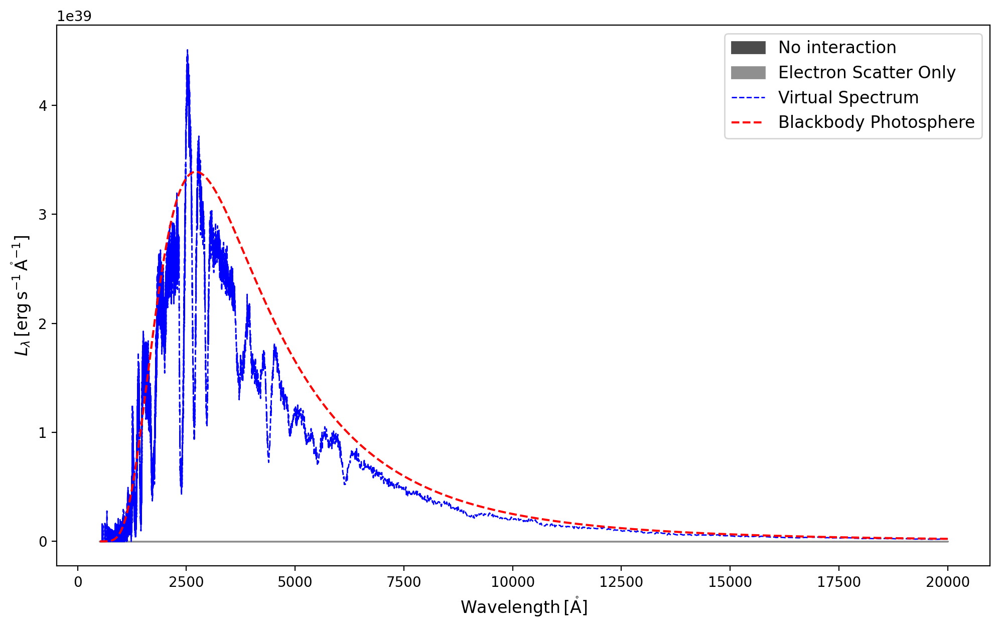

In [11]:
plotter.generate_plot_mpl(nelements = 3, species_list = ['Si II', 'S I-V', 'Ca'])

### Plotting flux instead of luminosity
You can plot in units of flux on the Y-axis of the SDEC plot, by specifying the `distance` parameter. It should be a quantity with a unit of length like m, Mpc, etc. and must be a positive value. By default, `distance=None` plots luminosity on the Y-axis.

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$F_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}\\,cm^{-2}}]$'>

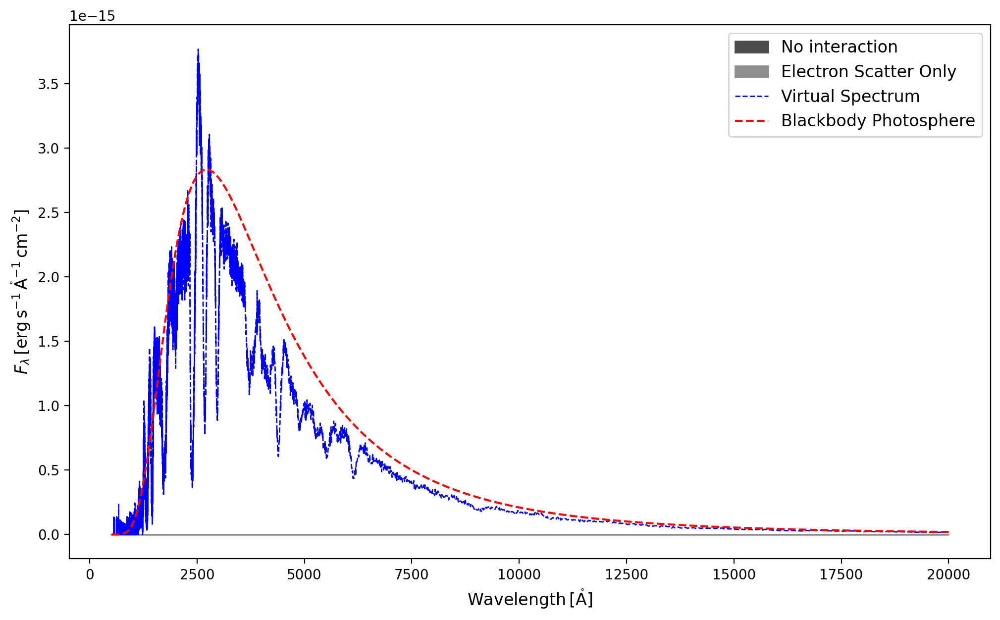

In [12]:
plotter.generate_plot_mpl(distance=100 * u.Mpc)

### Plotting an observed spectrum
To add an observed spectrum to the SDEC plot, you would need to pass the wavelength and the flux to the `observed_spectrum` parameter. The argument passed should be a tuple/list where the first value is the wavelength and the second value is the flux of the observed spectrum. Please note that these values should be instances of `astropy.Quantity`. 

In [13]:
import numpy as np
data = np.loadtxt('demo_observed_spectrum.dat')

observed_spectrum_wavelength, observed_spectrum_flux = data.T
observed_spectrum_wavelength = observed_spectrum_wavelength * u.AA
observed_spectrum_flux = observed_spectrum_flux * u.erg / (u.s * u.cm**2 * u.AA)

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$F_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}\\,cm^{-2}}]$'>

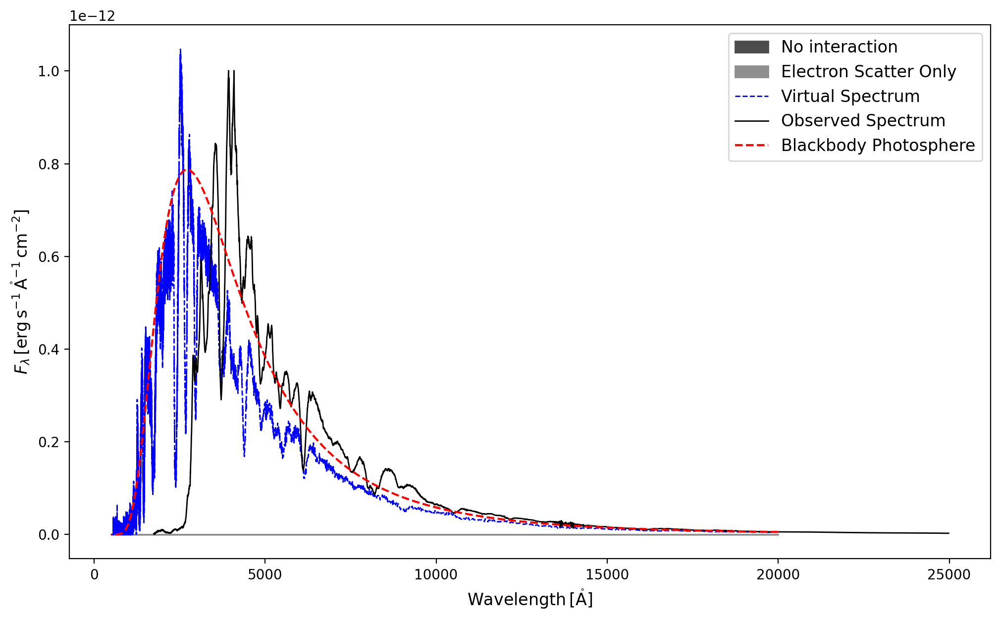

In [14]:
plotter.generate_plot_mpl(observed_spectrum = (observed_spectrum_wavelength, observed_spectrum_flux), distance = 6 * u.Mpc)

### Hiding modeled spectrum
By default, the modeled spectrum is shown in SDEC plot. You can hide it by setting `show_modeled_spectrum=False`.

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

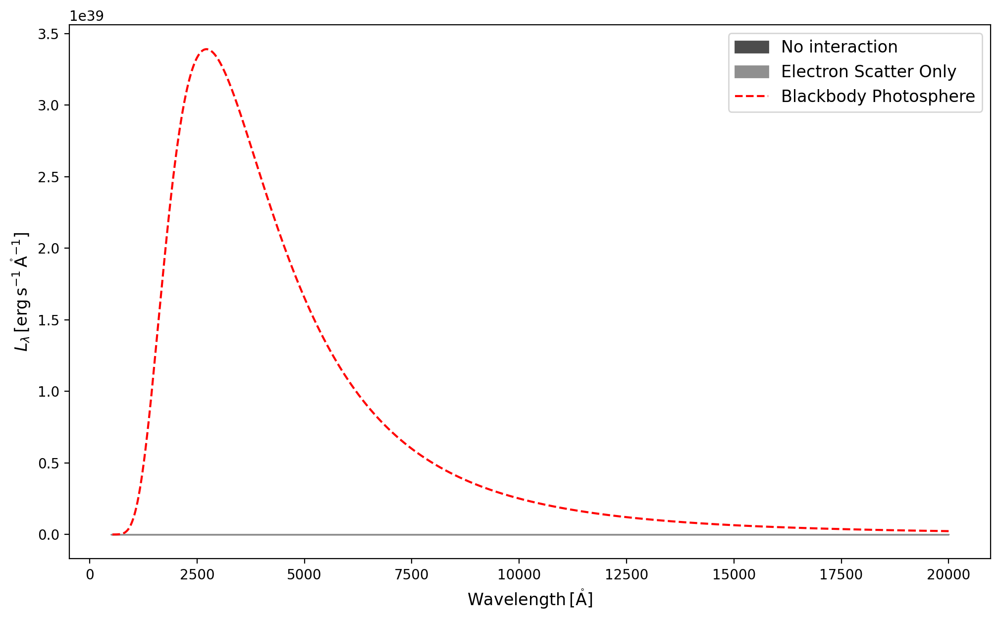

In [15]:
plotter.generate_plot_mpl(show_modeled_spectrum=False)

### Marking locations of spectral lines

If you have a list of line features you would like to point out on the plot, you can use the `lineid_plotter`, which acts as a wrapper for the `lineid_plot` package. Providing the function with a `matplotlib` `ax` along with the list of wavelength points and corresponding labels will add the spectral line markers.  The wrapper allows the user to supply kwargs to the `lineid_plot.plot_line_ids()` function, but also includes 3 preset configurations that can be specified with `style='top'/'inside'/'along'` parameter.

Below shows each of the styles with the SDEC Plot. Note: the markers will display as provided, regardless of features in the simulated spectrum. 

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

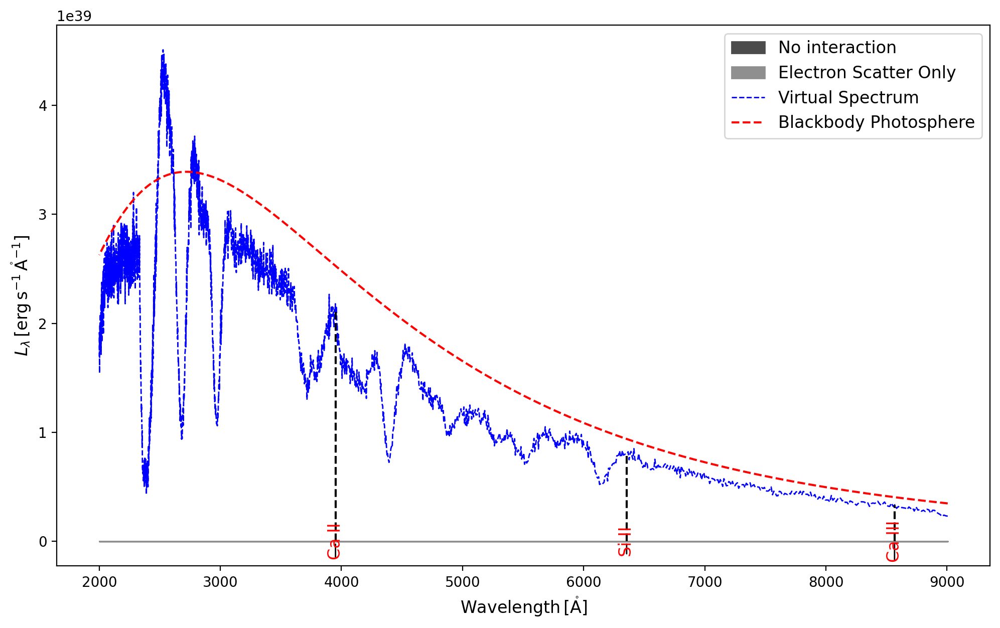

In [16]:
from tardis.visualization.tools.lineid_plotter import lineid_plotter

# following strongest lines in https://ned.ipac.caltech.edu/level5/March03/Filippenko/frames.html
line_waves = [3951, 6355, 8567]
line_labels = ['Ca II', 'Si II', 'Ca III']

# get necessary information from the sdec plotter
ax = plotter.generate_plot_mpl(packet_wvl_range=[2000, 9000]*u.AA)
spectrum_wavelengths = plotter.plot_wavelength
spectrum_data = plotter.modeled_spectrum_luminosity

lineid_plotter(ax, line_waves, line_labels, spectrum_wavelengths, spectrum_data, style='along',
    lineid_kwargs={'annotate_kwargs': {'color': 'red'}})

There are two other preset styles: 'top' and 'inside'

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

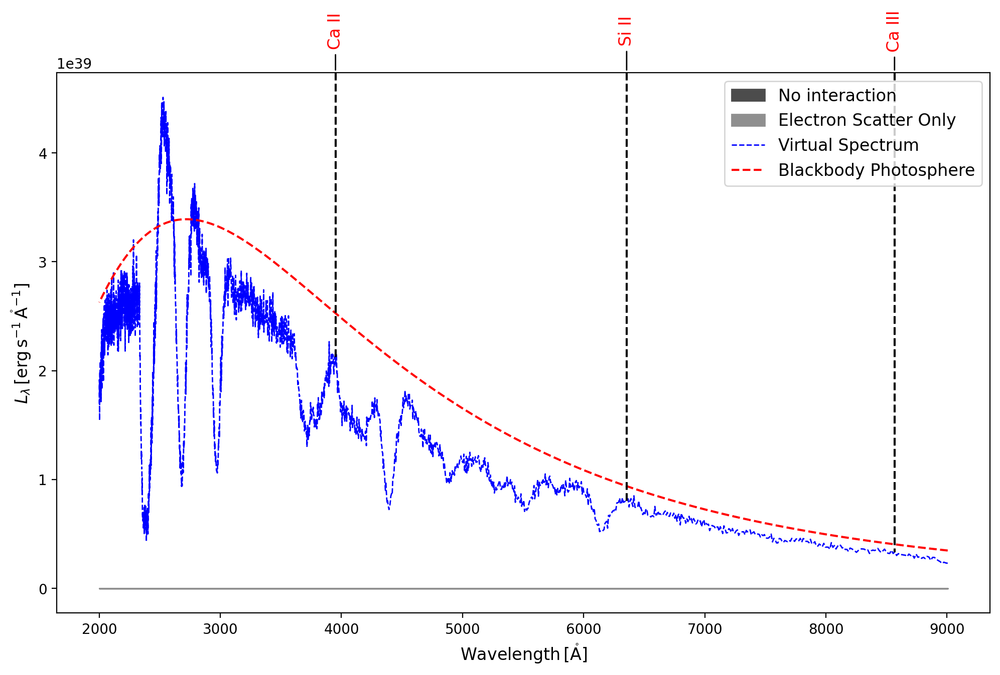

In [17]:
# using the top style
ax = plotter.generate_plot_mpl(packet_wvl_range=[2000, 9000]*u.AA)
lineid_plotter(ax, line_waves, line_labels, spectrum_wavelengths, spectrum_data, style='top',
    lineid_kwargs={'annotate_kwargs': {'color': 'red'}})

<Axes: xlabel='$\\text{Wavelength}\\,[\\mathrm{\\mathring{A}}]$', ylabel='$L_{\\lambda}\\,[\\mathrm{erg\\,s^{-1}\\,\\mathring{A}^{-1}}]$'>

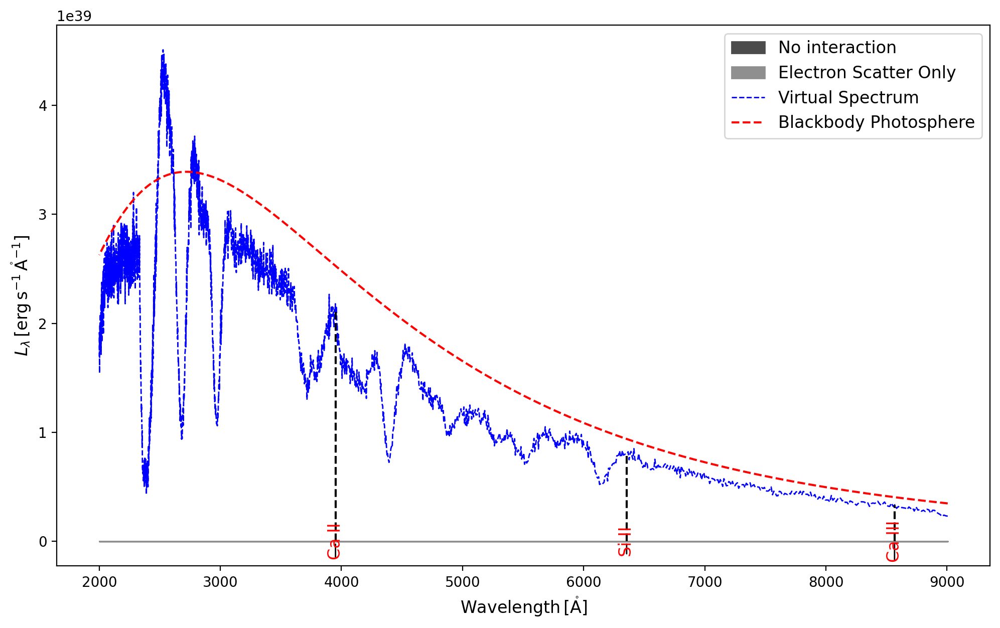

In [18]:
# using the inside style
ax = plotter.generate_plot_mpl(packet_wvl_range=[2000, 9000]*u.AA)
lineid_plotter(ax, line_waves, line_labels, spectrum_wavelengths, spectrum_data, style='inside',
    lineid_kwargs={'annotate_kwargs': {'color': 'red'}})

### Additional plotting options

In [19]:
# To list all available options (or parameters) with their description
help(plotter.generate_plot_mpl)

Help on method generate_plot_mpl in module tardis.visualization.tools.sdec_plot:

generate_plot_mpl(
    packets_mode='virtual',
    packet_wvl_range=None,
    distance=None,
    observed_spectrum=None,
    show_modeled_spectrum=True,
    ax=None,
    figsize=(12, 7),
    cmapname='jet',
    nelements=None,
    species_list=None,
    blackbody_photosphere=True
) method of tardis.visualization.tools.sdec_plot.SDECPlotter instance
    Generate Spectral element DEComposition (SDEC) Plot using matplotlib.

    Parameters
    ----------
    packets_mode : {'virtual', 'real'}, optional
        Mode of packets to be considered, either real or virtual. Default
        value is 'virtual'
    packet_wvl_range : astropy.Quantity or None, optional
        Wavelength range to restrict the analysis of escaped packets. It
        should be a quantity having units of Angstrom, containing two
        values - lower lambda and upper lambda i.e.
        [lower_lambda, upper_lambda] * u.AA. Default value 

The `generate_plot_mpl` method also has options specific to the matplotlib API, thereby providing you with more control over how your SDEC plot looks. Possible cases where you may use them are:

- `ax`: To plot SDEC on the Axis of a plot you're already working with, e.g. for subplots.

- `figsize`: To resize the SDEC plot as per your requirements.

- `cmapname`: To use a colormap of your preference, instead of "jet".

## Interactive Plot (in plotly)
If you're using the SDEC plot for exploration purposes, you should plot its interactive version by using `generate_plot_ply()`. This not only allows you to zoom & pan but also to inspect data values by hovering, to resize scale, etc. conveniently (as shown below).

![Interactions possible with SDEC plotly plot](../images/sdec_ply_interaction.gif)


**This method takes the exact same arguments as `generate_plot_mpl` except a few that are specific to the plotting library.** We can produce all the plots above in plotly, by passing the same arguments.

### Virtual packets mode

In [20]:
plotter.generate_plot_ply()

### Real packets mode

In [21]:
plotter.generate_plot_ply(packets_mode="real")

In a similar manner, you can also use the `packet_wvl_range`, `nelements`, `species_list`, `show_modeled_spectrum`, `observed_spectrum` and distance arguments in plotly plots (try it out in interactive mode!).

### Additional plotting options

The `generate_plot_ply` method also has options specific to the plotly API, thereby providing you with more control over how your SDEC plot looks. Possible cases where you may use them:
- `fig`: To plot the SDEC plot on a figure you are already using e.g. for subplots.
- `graph_height`: To specify the height of the graph as needed.
- `cmapname`: To use a colormap of your preference instead of "jet".

## Interactive plot (in bokeh)
An alternative interactive version is available using Bokeh via `generate_plot_bk()`. The Bokeh figure supports pan, zoom, box selection and saving; it also adds a colorbar on the right mapping elements to colours. Note that area glyphs (`varea`) do not include hover values by default, so hovering over the stacked areas will not show the numeric (x,y) tooltip the way Plotly does.

### Virtual packets mode

In [22]:
from bokeh.io import show

plot = plotter.generate_plot_bk()
show(plot)

### Real packets mode

In [23]:
plot = plotter.generate_plot_bk(packets_mode="real")
show(plot)

In a similar manner, you can also pass `packet_wvl_range`, `nelements`, `species_list`, `show_modeled_spectrum`, `observed_spectrum` and `distance` to the Bokeh plotter.

### Additional plotting options (Bokeh)

In [24]:
# To list all available options (or parameters) with their description
help(plotter.generate_plot_ply)

Help on method generate_plot_ply in module tardis.visualization.tools.sdec_plot:

generate_plot_ply(
    packets_mode='virtual',
    packet_wvl_range=None,
    distance=None,
    observed_spectrum=None,
    show_modeled_spectrum=True,
    fig=None,
    graph_height=600,
    cmapname='jet',
    nelements=None,
    species_list=None,
    blackbody_photosphere=True
) method of tardis.visualization.tools.sdec_plot.SDECPlotter instance
    Generate interactive Spectral element DEComposition (SDEC) Plot using plotly.

    Parameters
    ----------
    packets_mode : {'virtual', 'real'}, optional
        Mode of packets to be considered, either real or virtual. Default
        value is 'virtual'
    packet_wvl_range : astropy.Quantity or None, optional
        Wavelength range to restrict the analysis of escaped packets. It
        should be a quantity having units of Angstrom, containing two
        values - lower lambda and upper lambda i.e.
        [lower_lambda, upper_lambda] * u.AA. Defa

## Using simulation saved as HDF
Other than producing the SDEC Plot for simulation objects in runtime, you can also produce it for saved TARDIS simulations.

In [25]:
# hdf_plotter = SDECPlotter.from_hdf("demo.h5") ## Files is too large - just as an example

This `hdf_plotter` object is similar to the `plotter` object we used above, **so you can use each plotting method demonstrated above with this too.**

In [26]:
# Static plot with virtual packets mode
# hdf_plotter.generate_plot_mpl()

In [27]:
# Static plot with real packets mode
# hdf_plotter.generate_plot_mpl("real")

In [28]:
# Interactive plot with virtual packets mode
# hdf_plotter.generate_plot_ply()